In [2]:
import sys
import os

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
print("Project root added to sys.path")

Project root added to sys.path


In [2]:
import torch
import torch.nn 
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
import os

from clients.federated_training import federated_training
from utils.data_partition import dirichlet_partition


torch.manual_seed(42)
np.random.seed(42)

In [3]:
import os

# Create results directory in the notebook directory
os.makedirs("results", exist_ok=True)
print("Results directory created at:", os.path.abspath("results"))

Results directory created at: c:\Users\la7tim\Desktop\Internship\FedTinyProp\notebooks\results


In [4]:
from torch.utils.data import DataLoader
import torch

# load un-normalized dataset
raw_train = datasets.FashionMNIST('./data', train=True, download=True, transform=transforms.ToTensor())
loader = DataLoader(raw_train, batch_size=1024, num_workers=4)

# compute mean & std over all pixels
sum_, sum_sq_, n = 0.0, 0.0, 0
for x, _ in loader:
    sum_    += x.sum()
    sum_sq_ += (x**2).sum()
    n       += x.numel()

mean = sum_ / n
var  = sum_sq_ / n - mean**2
std  = torch.sqrt(var)

print(f"Computed mean = {mean.item():.4f}, std = {std.item():.4f}")


Computed mean = 0.2860, std = 0.3530


In [5]:

transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.2860,), (0.3530,))
    ])
    
    
trainset = datasets.FashionMNIST('./data', train=True, download=True, transform=transform)
testset = datasets.FashionMNIST('./data', train=False, transform=transform)
    
    

print(f"Training set size: {len(trainset)}")
print(f"Test set size: {len(testset)}")
print(f"Number of classes: {len(trainset.classes)}")

Training set size: 60000
Test set size: 10000
Number of classes: 10


In [6]:
num_clients = 5
partitions = {

    "medium":   dirichlet_partition(trainset, num_clients=num_clients, alpha=0.5),
}

partition_metadata = {
    
    "medium": {"alpha": 0.5}
}


c:\Users\la7tim\Desktop\Internship\FedTinyProp\utils\data_partition.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  labels = np.array(dataset.targets)



=== Partition Statistics for FASHIOMNIST ===

MEDIUM Partition:
Total samples: 60000

Per-client distribution:
Client 0: 6839 samples (11.40%)
Client 1: 10079 samples (16.80%)
Client 2: 21771 samples (36.29%)
Client 3: 11032 samples (18.39%)
Client 4: 10279 samples (17.13%)
[Debug] Number of classes: 10
[Debug] Number of clients: 5
[Debug] Processing client 0 with 6839 samples
[Debug] Client 0 has 6839 valid targets
[Debug] Client 0 class counts: [ 430.   20.   43. 1748.  822.   43.   66.   10. 1424. 2233.]
[Debug] Processing client 1 with 10079 samples
[Debug] Client 1 has 10079 valid targets
[Debug] Client 1 class counts: [1.700e+02 4.600e+01 8.000e+00 3.130e+03 2.970e+02 4.327e+03 1.869e+03
 6.400e+01 2.000e+00 1.660e+02]
[Debug] Processing client 2 with 21771 samples
[Debug] Client 2 has 21771 valid targets
[Debug] Client 2 class counts: [ 322. 4175. 3878.   17. 2970.   15. 2450. 1440. 4305. 2199.]
[Debug] Processing client 3 with 11032 samples
[Debug] Client 3 has 11032 valid tar

c:\Users\la7tim\Desktop\Internship\FedTinyProp\utils\partitions_visualization.py:17: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  targets = np.array(partitions[0].dataset.targets)


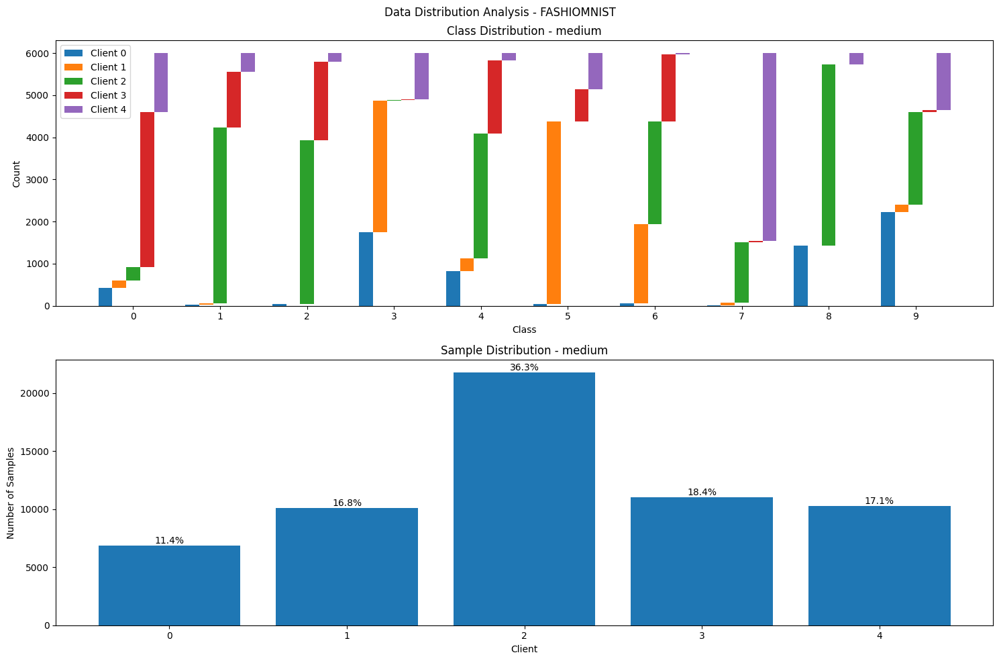

In [7]:
from utils.partitions_visualization import print_partition_stats, plot_data_distribution

# Print detailed statistics
print_partition_stats(partitions, "FASHIOMNIST")

# Create comprehensive visualization
fig = plot_data_distribution(partitions, "FASHIOMNIST")
plt.show()

In [8]:
from models.config import get_tinyprop_config

config = get_tinyprop_config("fashionmnist")
config['quantization_bits'] = 8  # Explicit for clarity

print("\nModel Configuration:")
for key, value in config.items():
    print(f"{key}: {value}")

tinyprop_params = config["tinyprop_params"]
print("\nTinyProp Parameters:")
print(f"S_min: {tinyprop_params.S_min}")
print(f"S_max: {tinyprop_params.S_max}")
print(f"zeta: {tinyprop_params.zeta}")
print(f"number_of_layers: {tinyprop_params.number_of_layers}")



Model Configuration:
tinyprop_params: <models.tinyProp.TinyPropParams object at 0x0000018DACEF6B90>
optimizer: {'type': 'sgd', 'lr': 0.0005, 'momentum': 0.7, 'weight_decay': 0.0001}
lr_scheduler: {'type': 'cosine', 'T_max': 100, 'eta_min': 1e-05, 'warmup_epochs': 5, 'warmup_start_lr': 1e-05}
gradient_clip: 1.0
batch_size: 32
num_epochs: 1
label_smoothing: 0.1
quantization: {'bits': 8, 'enabled': True}
quantization_bits: 8

TinyProp Parameters:
S_min: 0.05
S_max: 0.5
zeta: 0.25
number_of_layers: 4


In [ ]:
from clients.aggregators import sparse_fedavg_aggregate
def train_and_analyze_partition(partition_name, client_datasets, tinyprop_params):
    print(f"\nTraining on partition: {partition_name.upper()}")
    
    # Run training
    model, accuracy_list, flops_list, mem_list, comm_list, sparsity_list, \
    avg_grad_norm_list, avg_phi_list, skipped_batches_list, \
    effective_compute_ratio_list, client_eval_history, compression_ratio_list, \
    quantization_errors, avg_scale_factors, history = federated_training(
        client_datasets=client_datasets,
        model_name='fashionmnist',
        testset=testset,
        tinyprop_params=tinyprop_params,
        aggregator_fn=sparse_fedavg_aggregate,
        rounds=100,
        device="cuda" if torch.cuda.is_available() else "cpu",
        local_epochs=1,
        early_stopping_patience=100,
        early_stopping_delta=0.001,
        csv_log_path=f'results/fashionmnist_{partition_name}_training_log.csv',
        initial_sparsity=tinyprop_params.S_min,
        target_sparsity=tinyprop_params.S_max,
        energy_budget=1000,
        quantization_bits=8,  # Add quantization bits parameter
        save_dir='results',  # Add save directory for logs
        save_interval=1  # Save metrics every round
    )
    
    # Store quantization metrics in history
    history['quantization_errors'] = quantization_errors
    history['avg_scale_factors'] = avg_scale_factors
    
    return model, history

# Update the config to include quantization parameters
config = get_tinyprop_config('fashionmnist')
config['quantization_bits'] = 8  # Add quantization bits to config

partition_results = {}
for strategy_name, client_datasets in partitions.items():
    print(f"\nStarting training for {strategy_name.upper()} partition...")
    try:
        model, history = train_and_analyze_partition(strategy_name, client_datasets, tinyprop_params)
        partition_results[strategy_name] = {
            'model': model,
            'history': history,
            'quantization_metrics': {
                'errors': history['quantization_errors'],
                'scale_factors': history['avg_scale_factors']
            }
        }
        print(f"Completed training for {strategy_name.upper()}")
    except Exception as e:
        print(f"Error in {strategy_name.upper()}: {str(e)}")
        continue




Starting training for MEDIUM partition...

Training on partition: MEDIUM

Round 1/100
[Debug] Round 0 loss threshold: 0.1000
[Debug] Round 0 loss threshold: 0.1000
[Debug] Round 0 loss threshold: 0.1000
[Debug] Round 0 loss threshold: 0.1000
[Debug] Round 0 loss threshold: 0.1000

[Client Debug] Starting training for 1 epochs with batch size 32
[Debug] Round 0 loss threshold: 0.1000

[Batch 5] Debug Info:
  - Loss: 2.2738
  - Loss Change: 0.0000
  - Relative Loss Change: 0.0000
  - Dynamic Threshold: 0.2000
  - Current phi_k: 0.5372
  - Current phi_max: 0.9900
  - Layer Sparsity: 0.1343
  - Skip Ratio: 0.2000
  - Current Skip Ratio: 0.2000
  - Should Skip: False
[Debug][Batch 5] Loss: 2.2695
[Debug][Batch 5] Loss Change: -0.0043
[Debug][Batch 5] Relative Loss Change: 0.0019
[Debug][Batch 5] Phi Update: 0.0998
[Debug][Batch 5] New phi_k: 0.6171
[Debug] phi_k_history: [0.37955423625252277, 0.4584773989499834, 0.4578530156468926, 0.5372432824545914, 0.6170935308592026]

[Batch 10] Debug 

Found IID results at results/fashionmnist_5cl_iid.csv
Found MEDIUM results at results/fashionmnist_5cl_medium.csv
Found NON-IID results at results/fashionmnist_5cl_noniid.csv


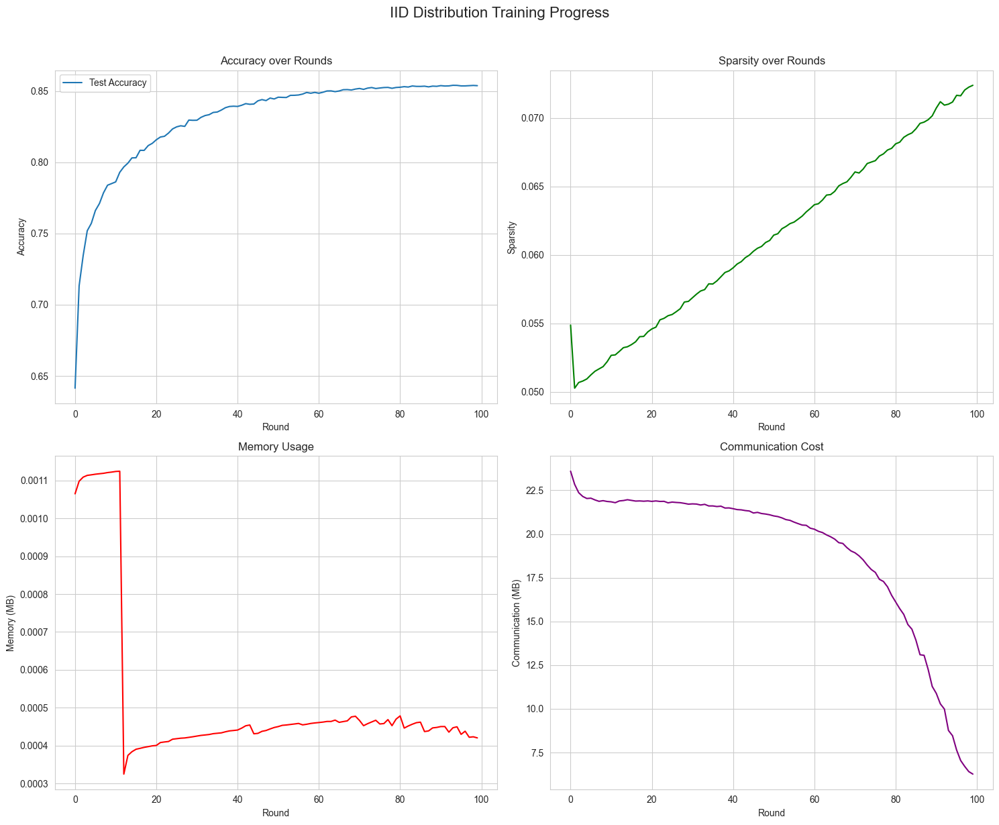

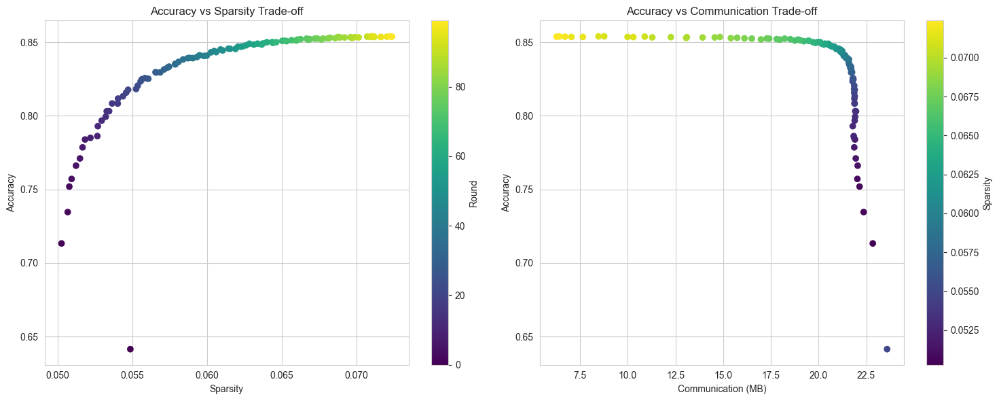

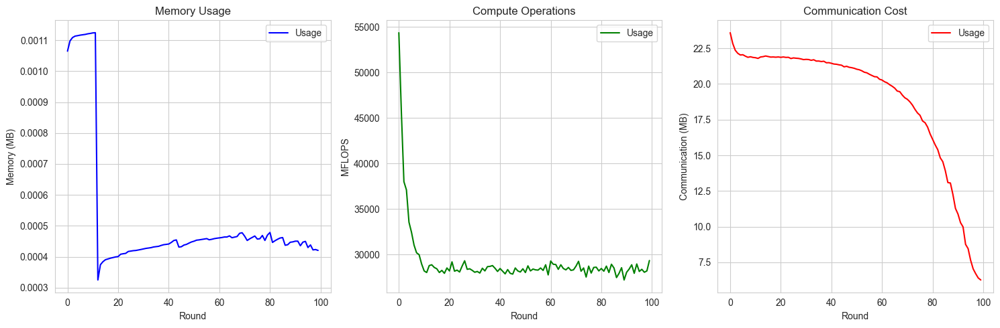

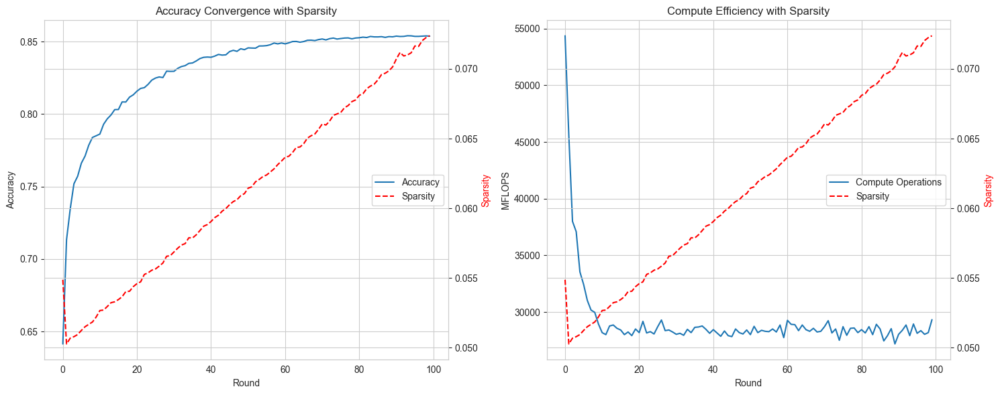

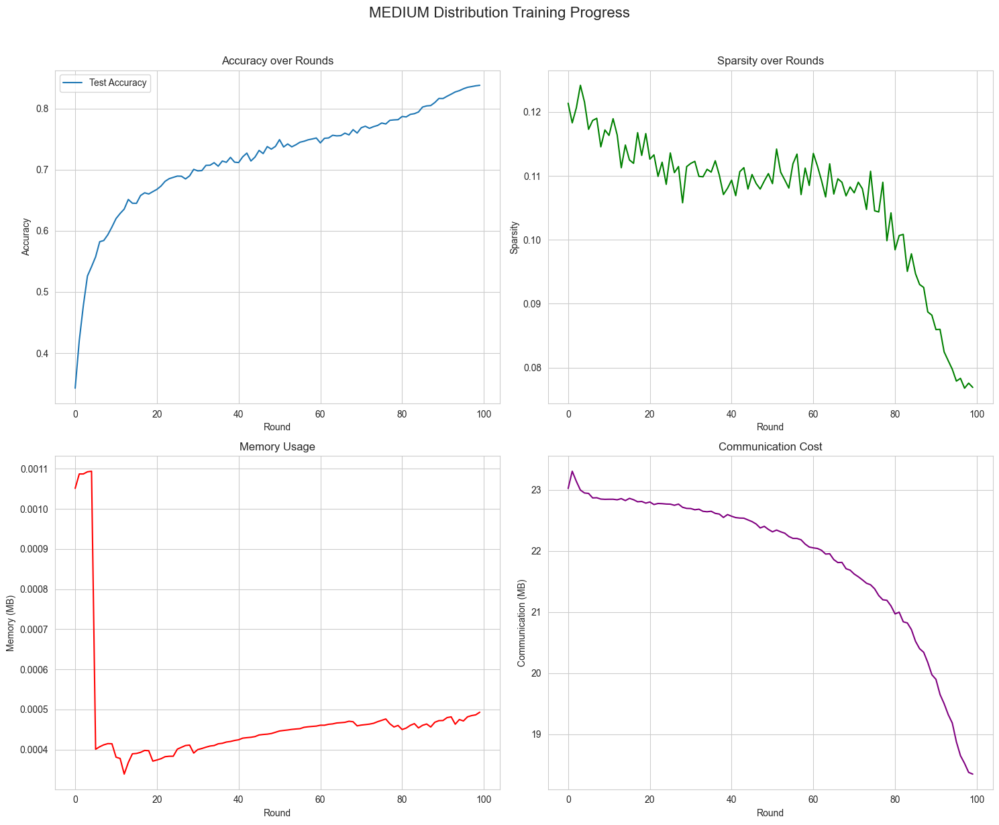

...

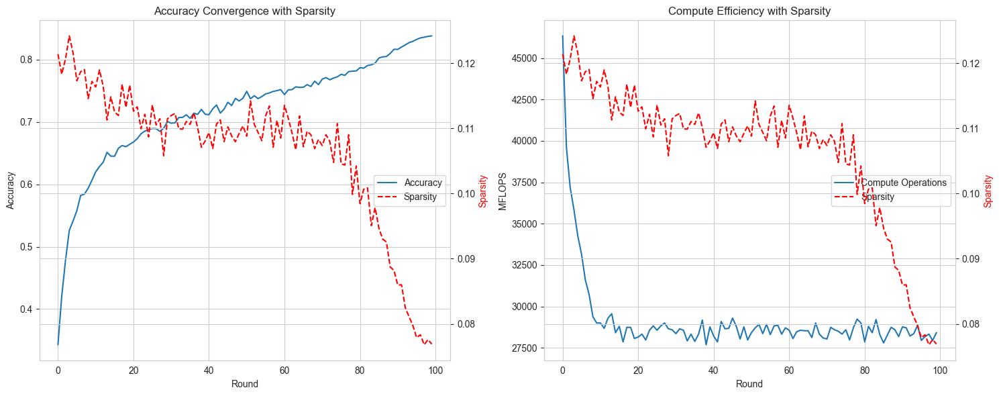

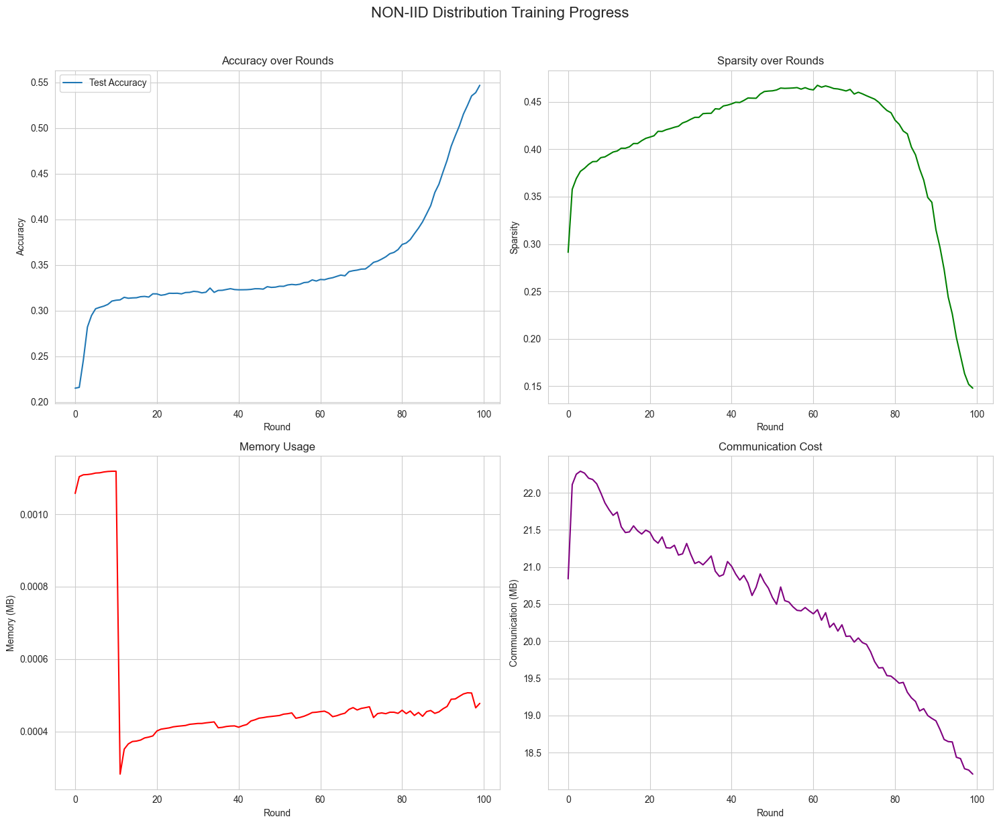

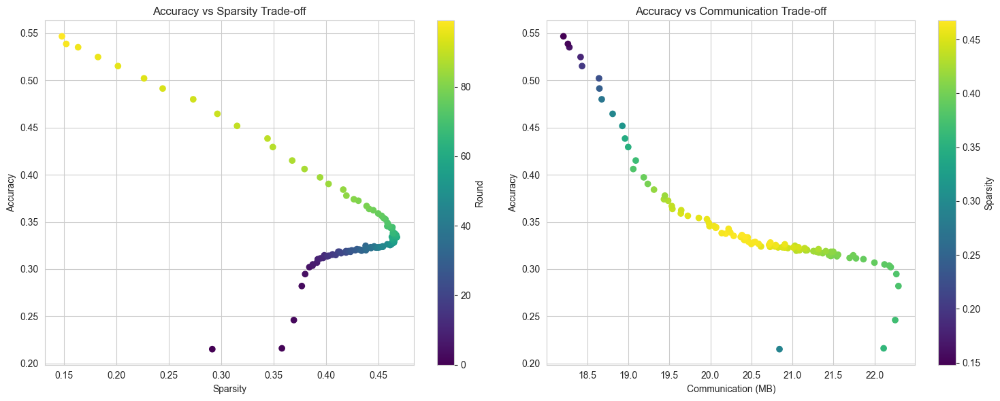

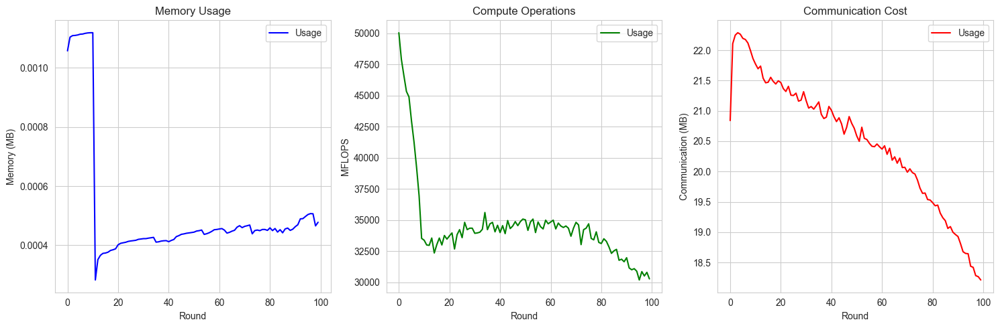

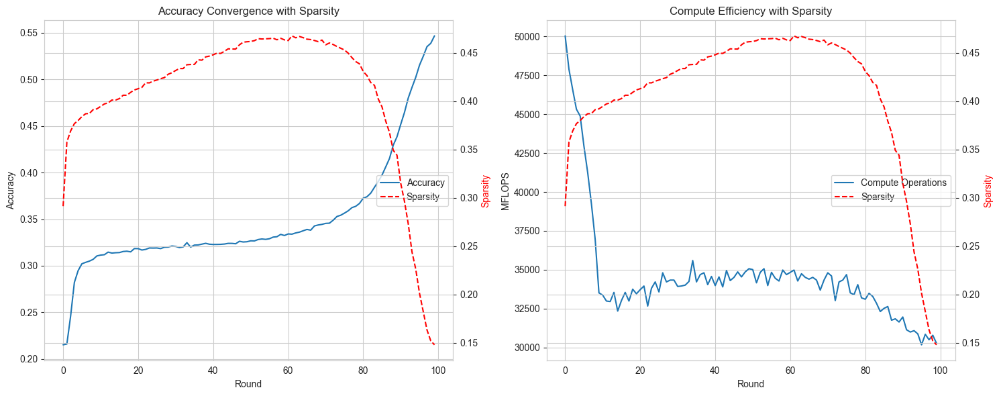


Summary Statistics:
         Final Accuracy  Max Accuracy  Average Memory (MB)  \
IID             0.85382       0.85408             0.000520   
MEDIUM          0.83796       0.83796             0.000469   
NON-IID         0.54668       0.54668             0.000510   

         Average Communication (MB)  Average FLOPS (MFLOPS)  Final Sparsity  \
IID                       18.941514            29142.109434        0.072376   
MEDIUM                    21.878402            29131.269729        0.076906   
NON-IID                   20.502143            34545.556263        0.148026   

         Compression Ratio  Effective Compute Ratio  
IID               1.078023                 0.500297  
MEDIUM            1.083313                 0.565993  
NON-IID           1.173745                 0.515275  


In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from utils.visualization import (
    plot_training_metrics,
    plot_efficiency_metrics,
    plot_hardware_profile,
    plot_convergence_analysis
)


csv_paths = {
    'IID': 'results/fashionmnist_5cl_iid.csv',
    'MEDIUM': 'results/fashionmnist_5cl_medium.csv',
    'NON-IID': 'results/fashionmnist_5cl_noniid.csv'
    
    
}

for partition, path in csv_paths.items():
    try:
        df = pd.read_csv(path)
        print(f"Found {partition} results at {path}")
    except FileNotFoundError:
        print(f"Warning: Could not find {partition} results at {path}")

for partition, path in csv_paths.items():
    try:
        df = pd.read_csv(path)
        history = {
            'accuracy': df['accuracy'].values,
            'sparsity': df['sparsity'].values,
            'memory_bytes': df['memory_bytes'].values,
            'communication_bytes': df['communication_bytes'].values,
            'flops': df['flops'].values
        }
        plot_training_metrics(history, title_prefix=f"{partition} Distribution")
        plot_efficiency_metrics(history)
        plot_hardware_profile(history)
        plot_convergence_analysis(history)
    except Exception as e:
        print(f"Error plotting {partition} results: {e}")


summary_stats = {}
for partition, path in csv_paths.items():
    try:
        df = pd.read_csv(path)
        summary_stats[partition] = {
            'Final Accuracy': df['accuracy'].iloc[-1],
            'Max Accuracy': df['accuracy'].max(),
            'Average Memory (MB)': df['memory_bytes'].mean() / 1e6,
            'Average Communication (MB)': df['communication_bytes'].mean() / 1e6,
            'Average FLOPS (MFLOPS)': df['flops'].mean() / 1e6,
            'Final Sparsity': df['sparsity'].iloc[-1],
            'Compression Ratio': 1 / (1 - df['sparsity'].iloc[-1]),
            'Effective Compute Ratio': (1 - df['sparsity'].iloc[-1]) * df['flops'].iloc[-1] / df['flops'].iloc[0]
        }
    except Exception as e:
        print(f"Error calculating statistics for {partition}: {e}")

summary_df = pd.DataFrame(summary_stats).T
print("\nSummary Statistics:")
print(summary_df)